# COVID-19 Literature Clustering

Approach:

- Unsupervised Learning task, because we don't have labels for the articles
- Clustering and Dimensionality Reduction task
- See how well labels from K-Means classify
- Use N-Grams with Hash Vectorizer
- Use plain text with Tf-idf
- Use K-Means for clustering
- Use t-SNE for dimensionality reduction
- Use PCA for dimensionality reduction
- There is no continuous flow of data, no need to adjust to changing data, and the data is small enough to fit in memory: Batch Learning
- Altough, there is no continuous flow of data, our approach has to be scalable as there will be more literature later

In [6]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import glob
import json

import matplotlib.pyplot as plt
plt.style.use('ggplot')

root_path = '../corona_research_challenge_data/2020-03-13/'
metadata_path = f'{root_path}/all_sources_metadata_2020-03-13.csv'
# Pathe to all json files
all_json = glob.glob(f'{root_path}/**/*.json', recursive=True)


meta_df = pd.read_csv(metadata_path, dtype={
    'pubmed_id': str,
    'Microsoft Academic Paper ID': str, 
    'doi': str
})
meta_df.head()

,sha,source_x,title,doi,pmcid,pubmed_id,license,abstract,publish_time,authors,journal,Microsoft Academic Paper ID,WHO #Covidence,has_full_text
0,c630ebcdf30652f0422c3ec12a00b50241dc9bd9,CZI,Angiotensin-converting enzyme 2 (ACE2) as a SA...,10.1007/s00134-020-05985-9,NaN,32125455,cc-by-nc,NaN,2020,"Zhang, Haibo; Penninger, Josef M.; Li, Yimin; ...",Intensive Care Med,2002765492,#3252,True
1,53eccda7977a31e3d0f565c884da036b1e85438e,CZI,Comparative genetic analysis of the novel coro...,10.1038/s41421-020-0147-1,NaN,NaN,cc-by,NaN,2020,"Cao, Yanan; Li, Lin; Feng, Zhimin; Wan, Shengq...",Cell Discovery,3003430844,#1861,True
2,210a892deb1c61577f6fba58505fd65356ce6636,CZI,Incubation Period and Other Epidemiological Ch...,10.3390/jcm9020538,NaN,NaN,cc-by,The geographic spread of 2019 novel coronaviru...,2020,"Linton, M. Natalie; Kobayashi, Tetsuro; Yang, ...",Journal of Clinical Medicine,3006065484,#1043,True
3,e3b40cc8e0e137c416b4a2273a4dca94ae8178cc,CZI,Characteristics of and Public Health Responses...,10.3390/jcm9020575,NaN,32093211,cc-by,"In December 2019, cases of unidentified pneumo...",2020,"Deng, Sheng-Qun; Peng, Hong-Juan",J Clin Med,177663115,#1999,True
4,92c2c9839304b4f2bc1276d41b1aa885d8b364fd,CZI,Imaging changes in severe COVID-19 pneumonia,10.1007/s00134-020-05976-w,NaN,32125453,cc-by-nc,NaN,2020,"Zhang, Wei",Intensive Care Med,3006643024,#3242,False


In [7]:
class FileReader:
    def __init__(self, file_path):
        with open(file_path) as file:
            content = json.load(file)
            self.paper_id = content['paper_id']
            self.abstract = []
            self.body_text = []
            # Abstract
            for entry in content['abstract']:
                self.abstract.append(entry['text'])
            # Body text
            for entry in content['body_text']:
                self.body_text.append(entry['text'])
            self.abstract = '\n'.join(self.abstract)
            self.body_text = '\n'.join(self.body_text)
    def __repr__(self):
        return f'{self.paper_id}: {self.abstract[:200]}... {self.body_text[:200]}...'
first_row = FileReader(all_json[0])
print(first_row)

27c85eb0542256f6599ba43e90986abfdb1ddc5b: We used a regression model to examine the impact of influenza on death rates in tropical Singapore for the period 1996-2003. Influenza A (H3N2) was the predominant circulating influenza virus subtype,... I nfluenza virus infections cause excess illness and deaths in temperate countries. In the Northern and Southern Hemispheres, influenza epidemics occur nearly every winter, leading to an increase in h...


In [8]:
def get_breaks(content, length):
    data = ""
    words = content.split(' ')
    total_chars = 0

    # add break every length characters
    for i in range(len(words)):
        total_chars += len(words[i])
        if total_chars > length:
            data = data + "<br>" + words[i]
            total_chars = 0
        else:
            data = data + " " + words[i]
    return data

In [11]:
from ast import literal_eval

dict_ = {'paper_id': [], 'abstract': [], 'body_text': [], 'authors': [], 'title': [], 'journal': [], 'abstract_summary': []}

for idx, entry in enumerate(all_json):
    if idx % (len(all_json) // 10) ==0:
        print(f'Processing index: {idx} of {len(all_json)}')
    content = FileReader(entry)
    dict_['paper_id'].append(content.paper_id)
    dict_['abstract'].append(content.abstract)
    dict_['body_text'].append(content.body_text)
    
    # create abstract summary
    if len(content.abstract) == 0:
        # no abstract provided
        dict_['abstract_summary'].append("Not provided.")
    elif len(content.abstract.split(" ")) > 100:
        # abstract provided is too long for plot, take first 300 words append with ...
        info = content.abstract.split(" ")[:100]
        summary = get_breaks(" ".join(info), 40)
        dict_['abstract_summary'].append(summary + "...")
    else:
        # abstract is short enough
        summary = get_breaks(content.abstract, 40)
        dict_['abstract_summary'].append(summary)
    # get metadata information
    meta_data = meta_df.loc[meta_df['sha'] == content.paper_id]
    
    try:
        # if more than one author
        authors = literal_eval(meta_data['authors'].values[0])
        if len(authors) > 2:
            # more than 2 authors, may be problem when plotting, so take first 2 append with ...
            dict_['authors'].append(". ".join(authors[:2]) + "...")
        else:
            # authors will fit in plot
            dict_['authors'].append(". ".join(authors))
    except Exception as e:
        # if only one author - or Null valie
        dict_['authors'].append(meta_data['authors'].values[0])
    
    # add the title information, add breaks when needed
    try:
        title = get_breaks(meta_data['title'].values[0], 40)
        dict_['title'].append(title)
    # if title was not provided
    except Exception as e:
        dict_['title'].append(meta_data['title'].values[0])
    
    # add the journal information
    dict_['journal'].append(meta_data['journal'].values[0])
    
df_covid = pd.DataFrame(dict_, columns=['paper_id', 'abstract', 'body_text', 'authors', 'title', 'journal', 'abstract_summary'])
df_covid.head()

Processing index: 0 of 13202
Processing index: 1320 of 13202
Processing index: 2640 of 13202
Processing index: 3960 of 13202
Processing index: 5280 of 13202
Processing index: 6600 of 13202
Processing index: 7920 of 13202
Processing index: 9240 of 13202
Processing index: 10560 of 13202
Processing index: 11880 of 13202
Processing index: 13200 of 13202


,paper_id,abstract,body_text,authors,title,journal,abstract_summary
0,27c85eb0542256f6599ba43e90986abfdb1ddc5b,We used a regression model to examine the impa...,I nfluenza virus infections cause excess illne...,"Chow, Angela. Ma, Stefan...",Influenza-associated Deaths in Tropical<br>Si...,Emerg Infect Dis,We used a regression model to examine the imp...
1,da6cb24186f59847fb1dcdb6614ab15b2bd3377c,January and June 2008. The 878-bp of the S1 ge...,"Infectious bronchitis (IB), caused by the IB v...","Pohuang, Tawatchai. Chansiripornchai, Niwat...",Detection and molecular characterization of<b...,J Vet Sci,January and June 2008. The 878-bp of the S1 g...
2,916602c93360fa550e272dcc72f00bd36be64817,,T he risk for deadly infectious diseases with ...,"Tognotti, Eugenia","Lessons from the History of Quarantine, from<...",Emerg Infect Dis,Not provided.
3,57a67fd5273fb4aac8505d1ae7b32c2582d12df3,,It has long been axiomatic that a protein's st...,"Theillet, Francois-Xavier. Binolfi, Andres...",Physicochemical Properties of Cells and Their...,Chem Rev,Not provided.
4,ed2de3694f5580ea38f4adf24bd1c8b46862df1f,Background: Mannose-binding lectin is a collec...,Mannose-binding lectin (MBL) is a pattern-reco...,"Albert, Richard K. Connett, John...",Mannose-binding lectin deficiency and acute<b...,Int J Chron Obstruct Pulmon Dis,Background: Mannose-binding lectin is a<br>co...


In [14]:
df_covid['abstract_word_count'] = df_covid['abstract'].apply(lambda x: len(x.strip().split()))
df_covid['body_word_count'] = df_covid['body_text'].apply(lambda x: len(x.strip().split()))
df_covid.drop_duplicates(['abstract', 'body_text'], inplace=True)
df_covid.head()

,paper_id,abstract,body_text,authors,title,journal,abstract_summary,abstract_word_count,body_word_count
0,27c85eb0542256f6599ba43e90986abfdb1ddc5b,We used a regression model to examine the impa...,I nfluenza virus infections cause excess illne...,"Chow, Angela. Ma, Stefan...",Influenza-associated Deaths in Tropical<br>Si...,Emerg Infect Dis,We used a regression model to examine the imp...,142,3199
1,da6cb24186f59847fb1dcdb6614ab15b2bd3377c,January and June 2008. The 878-bp of the S1 ge...,"Infectious bronchitis (IB), caused by the IB v...","Pohuang, Tawatchai. Chansiripornchai, Niwat...",Detection and molecular characterization of<b...,J Vet Sci,January and June 2008. The 878-bp of the S1 g...,144,1955
2,916602c93360fa550e272dcc72f00bd36be64817,,T he risk for deadly infectious diseases with ...,"Tognotti, Eugenia","Lessons from the History of Quarantine, from<...",Emerg Infect Dis,Not provided.,0,3355
3,57a67fd5273fb4aac8505d1ae7b32c2582d12df3,,It has long been axiomatic that a protein's st...,"Theillet, Francois-Xavier. Binolfi, Andres...",Physicochemical Properties of Cells and Their...,Chem Rev,Not provided.,0,32039
4,ed2de3694f5580ea38f4adf24bd1c8b46862df1f,Background: Mannose-binding lectin is a collec...,Mannose-binding lectin (MBL) is a pattern-reco...,"Albert, Richard K. Connett, John...",Mannose-binding lectin deficiency and acute<b...,Int J Chron Obstruct Pulmon Dis,Background: Mannose-binding lectin is a<br>co...,199,2613


In [15]:
df_covid['abstract'].describe(include='all')

count     13192
unique    11113
top            
freq       2067
Name: abstract, dtype: object

### Data Pre-processing

In [16]:
import re
# remove punctuation
df_covid['body_text'] = df_covid['body_text'].apply(lambda x: re.sub('[^a-zA-z0-9\s]','',x))
df_covid['abstract'] = df_covid['abstract'].apply(lambda x: re.sub('[^a-zA-z0-9\s]','',x))

In [17]:
def lower_case(input_str):
    input_str = input_str.lower()
    return input_str

df_covid['body_text'] = df_covid['body_text'].apply(lambda x: lower_case(x))
df_covid['abstract'] = df_covid['abstract'].apply(lambda x: lower_case(x))

In [18]:
df_covid.head(4)


,paper_id,abstract,body_text,authors,title,journal,abstract_summary,abstract_word_count,body_word_count
0,27c85eb0542256f6599ba43e90986abfdb1ddc5b,we used a regression model to examine the impa...,i nfluenza virus infections cause excess illne...,"Chow, Angela. Ma, Stefan...",Influenza-associated Deaths in Tropical<br>Si...,Emerg Infect Dis,We used a regression model to examine the imp...,142,3199
1,da6cb24186f59847fb1dcdb6614ab15b2bd3377c,january and june 2008 the 878bp of the s1 gene...,infectious bronchitis ib caused by the ib viru...,"Pohuang, Tawatchai. Chansiripornchai, Niwat...",Detection and molecular characterization of<b...,J Vet Sci,January and June 2008. The 878-bp of the S1 g...,144,1955
2,916602c93360fa550e272dcc72f00bd36be64817,,t he risk for deadly infectious diseases with ...,"Tognotti, Eugenia","Lessons from the History of Quarantine, from<...",Emerg Infect Dis,Not provided.,0,3355
3,57a67fd5273fb4aac8505d1ae7b32c2582d12df3,,it has long been axiomatic that a proteins str...,"Theillet, Francois-Xavier. Binolfi, Andres...",Physicochemical Properties of Cells and Their...,Chem Rev,Not provided.,0,32039


In [19]:
text = df_covid.drop(["paper_id", "abstract", "abstract_word_count", "body_word_count", "authors", "title", "journal", "abstract_summary"], axis=1)

In [24]:
text_arr = text.stack().tolist()

In [26]:
words = []
for i in range(0, len(text)):
    words.append(str(text.iloc[i]['body_text']).split(" "))

In [29]:
print (words[0][:10])

['i', 'nfluenza', 'virus', 'infections', 'cause', 'excess', 'illness', 'and', 'deaths', 'in']


In [30]:
n_gramm_all = []

for word in words:
    # get n-grams 
    n_gram = []
    for i in range(len(word) - 2 + 1):
        n_gram.append("".join(word[i:i+2]))
        
    n_gramm_all.append(n_gram)

### Vectorize with HashingVectorizer

use HashVectorizer to create the features vector X. For now, let's limit the feature size to 2**12(4096) to speed up the computation

In [47]:
from sklearn.feature_extraction.text import HashingVectorizer

# hash vectorizer instance
hvec = HashingVectorizer(lowercase=False, analyzer=lambda l:l, n_features=2**12)

# features matrix X
X = hvec.fit_transform(n_gramm_all)

In [48]:
from sklearn.model_selection import train_test_split

# test set size of 20% of the data and the random seed 42 <3
X_train, X_test = train_test_split(X.toarray(), test_size=0.2, random_state=42)

print("X_train size:", len(X_train))
print("X_test size:", len(X_test), "\n")

X_train size: 10553
X_test size: 2639 



### Dimensionality Reduction with t-SNE

In [51]:
from sklearn.manifold import TSNE

tsne = TSNE(verbose=1, perplexity=5)
X_embedded = tsne.fit_transform(X_train)

[t-SNE] Computing 16 nearest neighbors...
[t-SNE] Indexed 10553 samples in 2.327s...
[t-SNE] Computed neighbors for 10553 samples in 674.379s...
[t-SNE] Computed conditional probabilities for sample 1000 / 10553
[t-SNE] Computed conditional probabilities for sample 2000 / 10553
[t-SNE] Computed conditional probabilities for sample 3000 / 10553
[t-SNE] Computed conditional probabilities for sample 4000 / 10553
[t-SNE] Computed conditional probabilities for sample 5000 / 10553
[t-SNE] Computed conditional probabilities for sample 6000 / 10553
[t-SNE] Computed conditional probabilities for sample 7000 / 10553
[t-SNE] Computed conditional probabilities for sample 8000 / 10553
[t-SNE] Computed conditional probabilities for sample 9000 / 10553
[t-SNE] Computed conditional probabilities for sample 10000 / 10553
[t-SNE] Computed conditional probabilities for sample 10553 / 10553
[t-SNE] Mean sigma: 0.216264
[t-SNE] KL divergence after 250 iterations with early exaggeration: 207.409195
[t-SNE] 

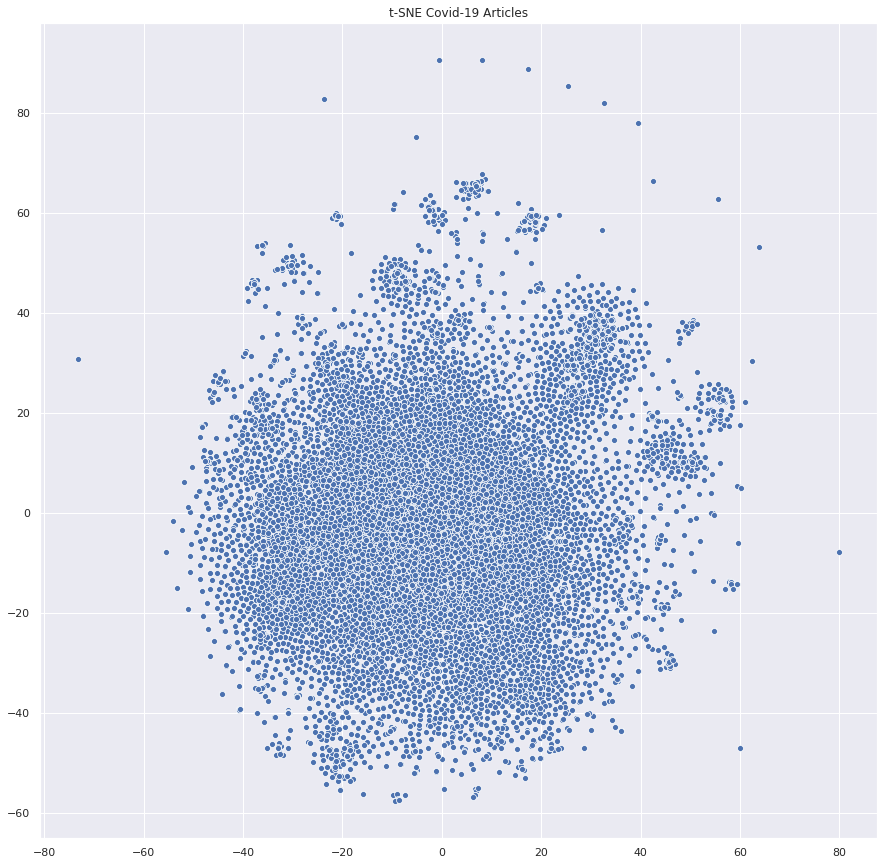

In [52]:
from matplotlib import pyplot as plt
import seaborn as sns

# sns settings
sns.set(rc={'figure.figsize':(15,15)})

# colors
palette = sns.color_palette("bright", 1)

# plot
sns.scatterplot(X_embedded[:,0], X_embedded[:,1], palette=palette)

plt.title("t-SNE Covid-19 Articles")
# plt.savefig("plots/t-sne_covid19.png")
plt.show()

We can clearly see few clusters forming. This may be a good sign that we are able to cluster similar articles together using 2-grams and HashVectorizer with 2**10 features. However, without labels it is difficult to see the clusters. For now, it looks like a blob of data... Let's try if we can use K-Means to generate our labels. We can later use this information to produce a scatterplot with labels to verify the clusters.

In [53]:
from sklearn.cluster import KMeans

k = 10
kmeans = KMeans(n_clusters=k, n_jobs=4, verbose=10)
y_pred = kmeans.fit_predict(X_train)

In [54]:
# labels for the training set
y_train = y_pred
# Labels for the test set:
y_test = kmeans.predict(X_test)

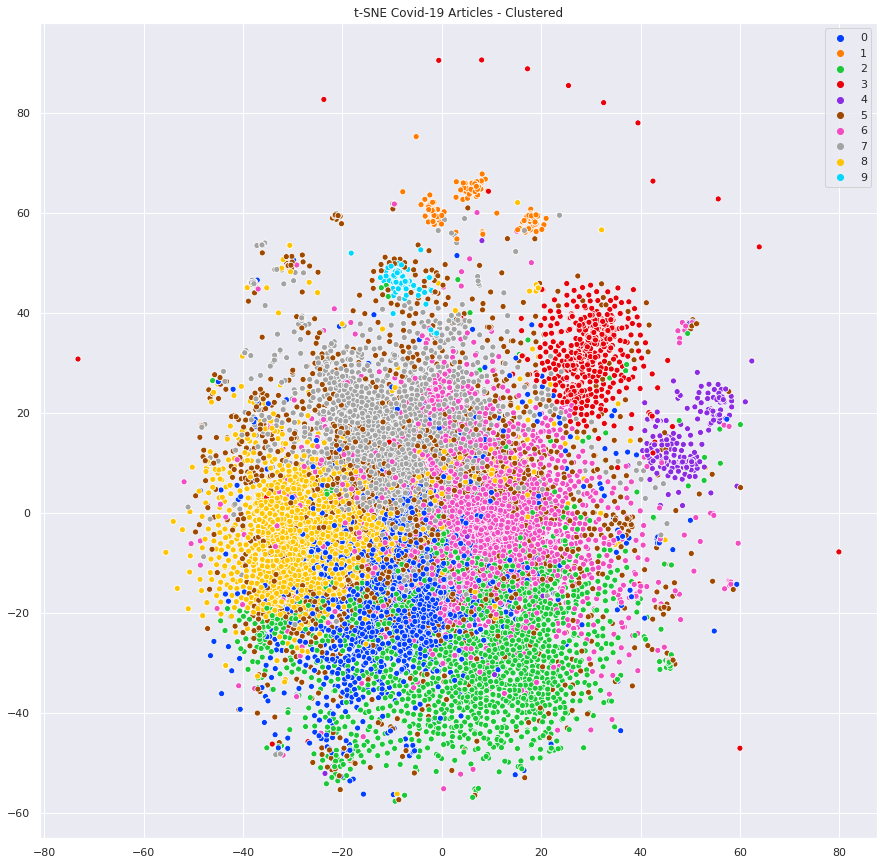

In [55]:
# sns settings
sns.set(rc={'figure.figsize':(15,15)})

# colors
palette = sns.color_palette("bright", len(set(y_pred)))

# plot
sns.scatterplot(X_embedded[:,0], X_embedded[:,1], hue=y_pred, legend='full', palette=palette)
plt.title("t-SNE Covid-19 Articles - Clustered")
# plt.savefig("plots/t-sne_covid19_label.png")
plt.show()

In [56]:
# function to print out classification model report
def classification_report(model_name, test, pred):
    from sklearn.metrics import precision_score, recall_score
    from sklearn.metrics import accuracy_score
    from sklearn.metrics import f1_score
    
    print(model_name, ":\n")
    print("Accuracy Score: ", '{:,.3f}'.format(float(accuracy_score(test, pred)) * 100), "%")
    print("     Precision: ", '{:,.3f}'.format(float(precision_score(test, pred, average='micro')) * 100), "%")
    print("        Recall: ", '{:,.3f}'.format(float(recall_score(test, pred, average='micro')) * 100), "%")
    print("      F1 score: ", '{:,.3f}'.format(float(f1_score(test, pred, average='micro')) * 100), "%")

In [57]:
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import RandomForestClassifier

# random forest classifier instance
forest_clf = RandomForestClassifier(n_estimators=100, random_state=42, n_jobs=4)

# cross validation on the training set 
forest_scores = cross_val_score(forest_clf, X_train, y_train, cv=3, n_jobs=4)

# print out the mean of the cross validation scores
print("Accuracy: ", '{:,.3f}'.format(float(forest_scores.mean()) * 100), "%")

Accuracy:  74.623 %


### Vectorize Using Tf-idf with Plain Text**

Let's see if we will be able to get better clusters using plain text as instances rather than 2-grams and vectorize it using Tf-idf. Last time we separated the dataset into test and training sets because we wanted to do classification with the labels we got through clustering. This time we will just use the all dataset because the goal is to cluster all literature.

In [58]:
from sklearn.feature_extraction.text import TfidfVectorizer

vectorizer = TfidfVectorizer(max_features=2**12)
X = vectorizer.fit_transform(df_covid['body_text'].values)

### MiniBatchKMeans with Plain text and Tf-idf

Again, let's try to get our labels. We will choose 10 clusters again. This time, we will use MiniBatchKMeans as it is faster with more data:

In [62]:
from sklearn.cluster import MiniBatchKMeans

k=10
kmeans = MiniBatchKMeans(n_clusters=k)
y_pred = kmeans.fit_predict(X)

In [65]:
y = y_pred

In [66]:
from sklearn.manifold import TSNE

tsne = TSNE(verbose=1)
X_embedded = tsne.fit_transform(X.toarray())

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 13192 samples in 2.819s...
[t-SNE] Computed neighbors for 13192 samples in 980.547s...
[t-SNE] Computed conditional probabilities for sample 1000 / 13192
[t-SNE] Computed conditional probabilities for sample 2000 / 13192
[t-SNE] Computed conditional probabilities for sample 3000 / 13192
[t-SNE] Computed conditional probabilities for sample 4000 / 13192
[t-SNE] Computed conditional probabilities for sample 5000 / 13192
[t-SNE] Computed conditional probabilities for sample 6000 / 13192
[t-SNE] Computed conditional probabilities for sample 7000 / 13192
[t-SNE] Computed conditional probabilities for sample 8000 / 13192
[t-SNE] Computed conditional probabilities for sample 9000 / 13192
[t-SNE] Computed conditional probabilities for sample 10000 / 13192
[t-SNE] Computed conditional probabilities for sample 11000 / 13192
[t-SNE] Computed conditional probabilities for sample 12000 / 13192
[t-SNE] Computed conditional probabilities for s

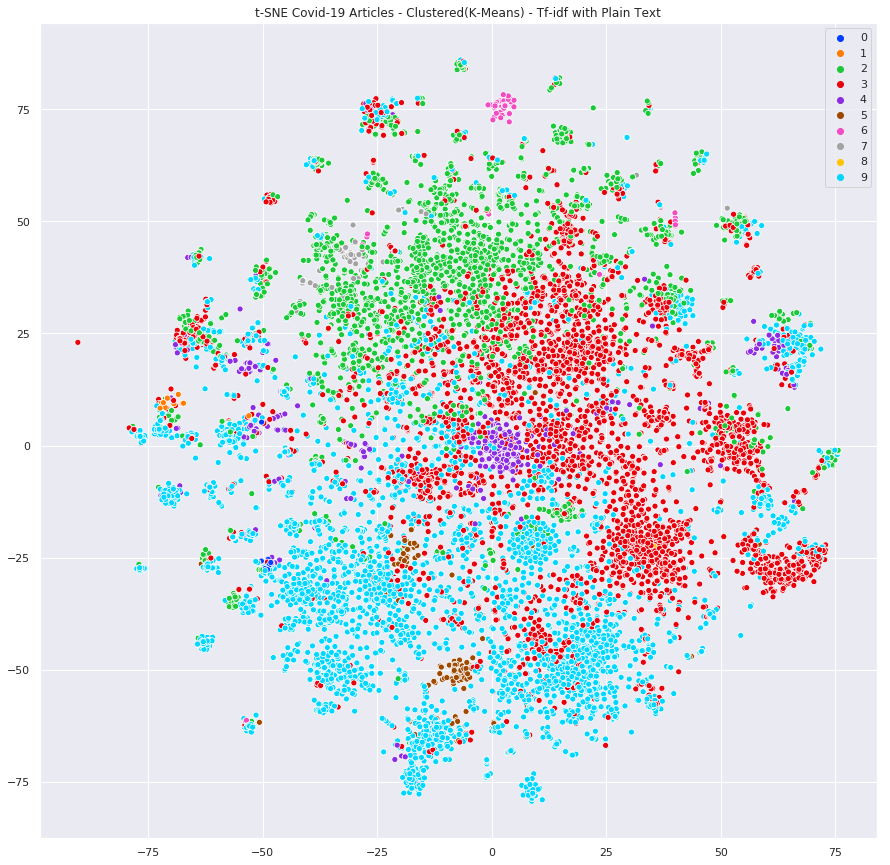

In [67]:
from matplotlib import pyplot as plt
import seaborn as sns

# sns settings
sns.set(rc={'figure.figsize':(15,15)})

# colors
palette = sns.color_palette("bright", len(set(y)))

# plot
sns.scatterplot(X_embedded[:,0], X_embedded[:,1], hue=y, legend='full', palette=palette)
plt.title("t-SNE Covid-19 Articles - Clustered(K-Means) - Tf-idf with Plain Text")
# plt.savefig("plots/t-sne_covid19_label_TFID.png")
plt.show()

There are clearly more than 10 clusters...

In [68]:
from sklearn.cluster import MiniBatchKMeans

k = 20
kmeans = MiniBatchKMeans(n_clusters=k)
y_pred = kmeans.fit_predict(X)
y = y_pred

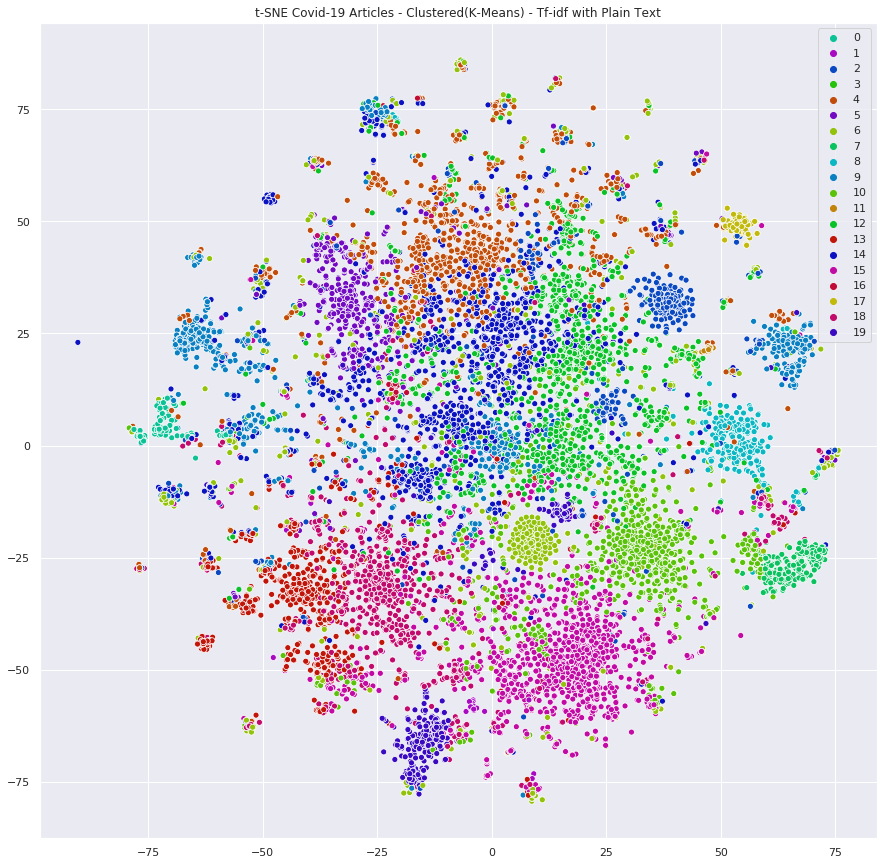

In [69]:
from matplotlib import pyplot as plt
import seaborn as sns
import random 

# sns settings
sns.set(rc={'figure.figsize':(15,15)})

# let's shuffle the list so distinct colors stay next to each other
palette = sns.hls_palette(20, l=.4, s=.9)
random.shuffle(palette)

# plot
sns.scatterplot(X_embedded[:,0], X_embedded[:,1], hue=y, legend='full', palette=palette)
plt.title("t-SNE Covid-19 Articles - Clustered(K-Means) - Tf-idf with Plain Text")
# plt.savefig("plots/t-sne_covid19_20label_TFID.png")
plt.show()

In [70]:
from bokeh.models import ColumnDataSource, HoverTool, LinearColorMapper
from bokeh.palettes import Category20
from bokeh.transform import linear_cmap
from bokeh.io import output_file, show
from bokeh.transform import transform
from bokeh.io import output_notebook
from bokeh.plotting import figure

output_notebook()
y_labels = y

# data sources
source = ColumnDataSource(data=dict(
    x= X_embedded[:,0], 
    y= X_embedded[:,1], 
    desc= y_labels, 
    titles= df_covid['title'],
    authors = df_covid['authors'],
    journal = df_covid['journal'],
    abstract = df_covid['abstract_summary']
    ))

# hover over information
hover = HoverTool(tooltips=[
    ("Title", "@titles{safe}"),
    ("Author(s)", "@authors"),
    ("Journal", "@journal"),
    ("Abstract", "@abstract{safe}"),
],
                 point_policy="follow_mouse")

# map colors
mapper = linear_cmap(field_name='desc', 
                     palette=Category20[20],
                     low=min(y_labels) ,high=max(y_labels))

# prepare the figure
p = figure(plot_width=800, plot_height=800, 
           tools=[hover, 'pan', 'wheel_zoom', 'box_zoom', 'reset'], 
           title="t-SNE Covid-19 Articles, Clustered(K-Means), Tf-idf with Plain Text", 
           toolbar_location="right")

# plot
p.scatter('x', 'y', size=5, 
          source=source,
          fill_color=mapper,
          line_alpha=0.3,
          line_color="black")

# output_file('plots/t-sne_covid-19_interactive.html')
show(p)

Loading BokehJS ...